In [1]:
pip install pmdarima

Note: you may need to restart the kernel to use updated packages.


In [100]:
pip install sktime

     |████████████████████████████████| 6.5 MB 4.0 MB/s eta 0:00:01
     |████████████████████████████████| 16.9 MB 723 kB/s eta 0:00:011
  Attempting uninstall: numpy
    Found existing installation: numpy 1.20.1
    Uninstalling numpy-1.20.1:
      Successfully uninstalled numpy-1.20.1
Note: you may need to restart the kernel to use updated packages.


In [104]:
pip install lightgbm

In [112]:
pip install xgboost

     |████████████████████████████████| 1.3 MB 4.1 MB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pylab import rcParams
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.tsatools import detrend
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
import pmdarima as pm
from pmdarima.model_selection import train_test_split
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.arima_model import ARMA
from sklearn.metrics import mean_squared_error
from math import sqrt
from pandas import DataFrame
from matplotlib import pyplot
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

# Data Preprocessing and Analysis

In [12]:
data = pd.read_csv('taxi.csv')
data

,datetime,num_orders
0,01/03/2018 00:00,9
1,01/03/2018 00:10,14
2,01/03/2018 00:20,28
3,01/03/2018 00:30,20
4,01/03/2018 00:40,32
...,...,...
26491,31/08/2018 23:10,32
26492,31/08/2018 23:20,24
26493,31/08/2018 23:30,27
26494,31/08/2018 23:40,39


In [13]:
data['datetime'] = pd.to_datetime(data['datetime'])

In [14]:
data

,datetime,num_orders
0,2018-01-03 00:00:00,9
1,2018-01-03 00:10:00,14
2,2018-01-03 00:20:00,28
3,2018-01-03 00:30:00,20
4,2018-01-03 00:40:00,32
...,...,...
26491,2018-08-31 23:10:00,32
26492,2018-08-31 23:20:00,24
26493,2018-08-31 23:30:00,27
26494,2018-08-31 23:40:00,39


Text(0.5, 1.0, 'Raw data plot of orders booked w.r.t time')

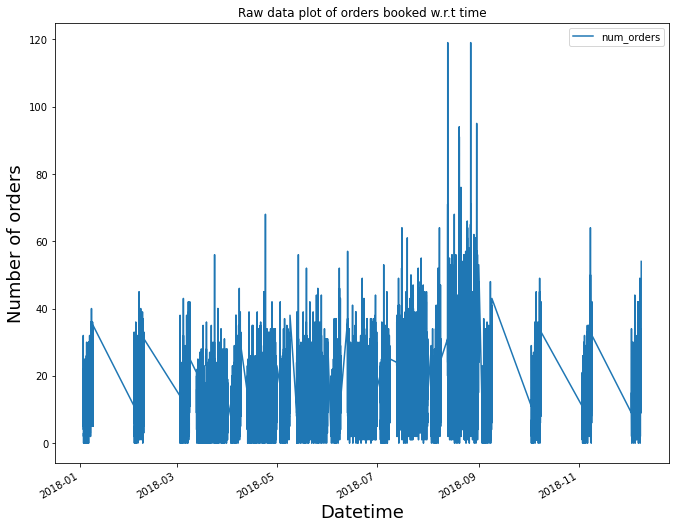

In [15]:
rcParams['figure.figsize'] = 11, 9
data.set_index('datetime',inplace=True)
data.plot()
plt.ylabel('Number of orders', fontsize=18)
plt.xlabel('Datetime', fontsize=18)
plt.title('Raw data plot of orders booked w.r.t time')

In [16]:
data

,num_orders
datetime,
2018-01-03 00:00:00,9
2018-01-03 00:10:00,14
2018-01-03 00:20:00,28
2018-01-03 00:30:00,20
2018-01-03 00:40:00,32
...,...
2018-08-31 23:10:00,32
2018-08-31 23:20:00,24
2018-08-31 23:30:00,27


In [17]:
# Resample minutely to hourly data, sum and save as new dataframe
data_hourly = data.resample('H').sum()
data_hourly

,num_orders
datetime,
2018-01-03 00:00:00,124
2018-01-03 01:00:00,85
2018-01-03 02:00:00,71
2018-01-03 03:00:00,66
2018-01-03 04:00:00,43
...,...
2018-12-08 19:00:00,82
2018-12-08 20:00:00,98
2018-12-08 21:00:00,135


Text(0.5, 1.0, 'Total number of orders booked hourly')

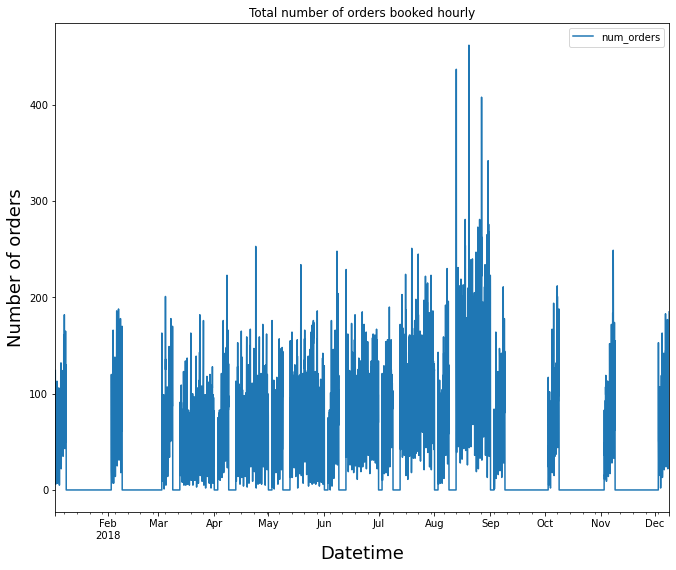

In [18]:
rcParams['figure.figsize'] = 11, 9
data_hourly.plot()
plt.ylabel('Number of orders', fontsize=18)
plt.xlabel('Datetime', fontsize=18)
plt.title('Total number of orders booked hourly')

In [19]:
data_hourly.isnull().sum()

num_orders    0
dtype: int64

Text(0.5, 1.0, 'Hourly as frequency')

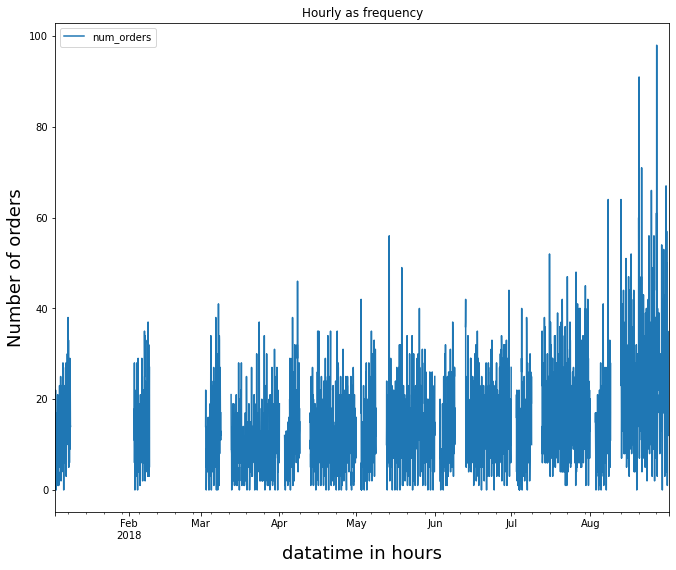

In [20]:
rcParams['figure.figsize'] = 11, 9
data.asfreq('H').plot()
plt.ylabel('Number of orders', fontsize=18)
plt.xlabel('datatime in hours', fontsize=18)
plt.title('Hourly as frequency')

In [21]:
data_dailly = data.resample('D').sum()
data_dailly

,num_orders
datetime,
2018-01-03,1364
2018-01-04,1248
2018-01-05,1331
2018-01-06,1956
2018-01-07,2090
...,...
2018-12-04,1491
2018-12-05,1651
2018-12-06,2072


In [22]:
data_dailly_mean = data.resample('D').mean()
data_dailly_mean

,num_orders
datetime,
2018-01-03,9.472222
2018-01-04,8.666667
2018-01-05,9.243056
2018-01-06,13.583333
2018-01-07,14.513889
...,...
2018-12-04,10.354167
2018-12-05,11.465278
2018-12-06,14.388889


Text(0.5, 1.0, 'Daily as frequency')

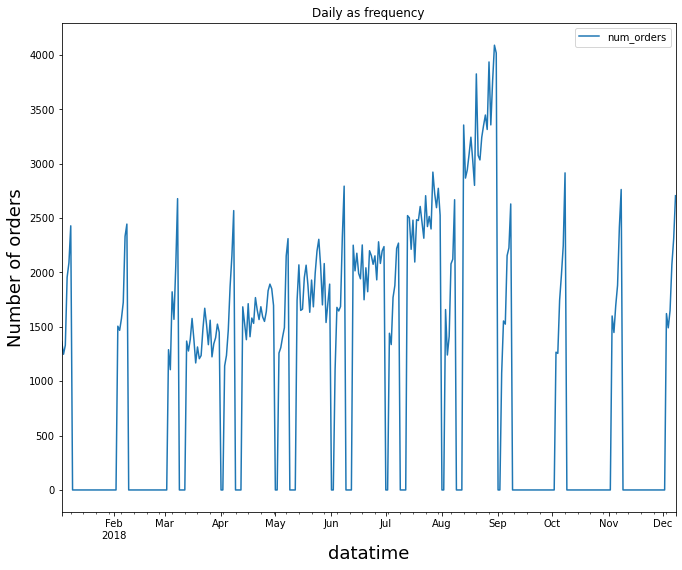

In [23]:
rcParams['figure.figsize'] = 11, 9
data_dailly.plot()
plt.ylabel('Number of orders', fontsize=18)
plt.xlabel('datatime', fontsize=18)
plt.title('Daily as frequency')

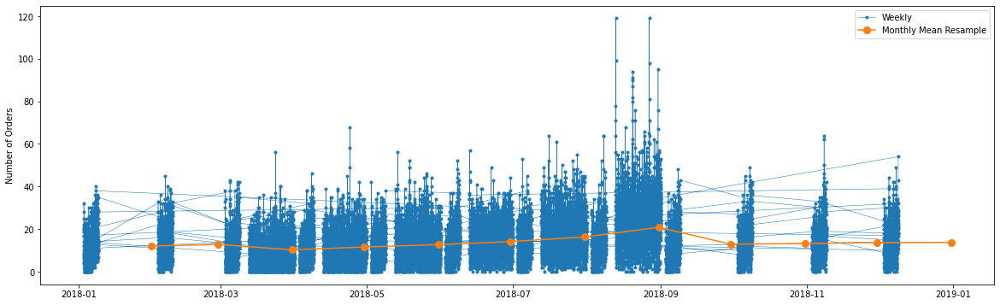

In [24]:
#plot the mean for aggregate dates.

fig, ax = plt.subplots(figsize=(20, 6))
ax.plot(data,marker='.', linestyle='-', linewidth=0.5, label='Weekly')
ax.plot(data.resample('M').mean(),marker='o', markersize=8, linestyle='-', label='Monthly Mean Resample')
ax.set_ylabel('Number of Orders')
ax.legend();

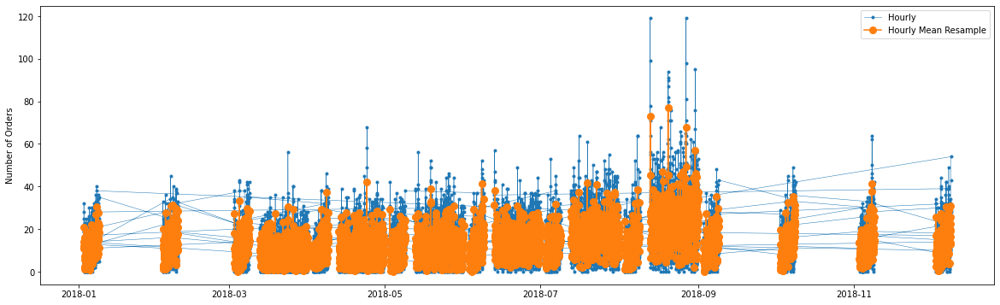

In [25]:
#plot the mean for aggregate dates by resampling to hourly.

fig, ax = plt.subplots(figsize=(20, 6))
ax.plot(data,marker='.', linestyle='-', linewidth=0.5, label='Hourly')
ax.plot(data.resample('H').mean(),marker='o', markersize=8, linestyle='-', label='Hourly Mean Resample')
ax.set_ylabel('Number of Orders')
ax.legend();

# Augmented Dickey Fueller Test

In [26]:
from statsmodels.tsa.stattools import adfuller
from numpy import log
result = adfuller(data_hourly.num_orders, autolag='AIC')
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
	print('\t%s: %.3f' % (key, value))

ADF Statistic: -6.931675
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567


It gives us a statistic value of -6.9. The more negative this statistic, the more likely we are to reject the null hypothesis (we have a stationary dataset).

As part of the output, we get a look-up table to find the ADF statistic. We see that our statistic value of -6.9 is less than the value of -3.431 at 1%.

This shows that we can reject the null hypothesis with a significance level of less than 1% (i.e. a low probability that the result is a statistical fluke).

Rejecting the null hypothesis means that the process has no unit root, and in turn that the time series is stationary or does not have time-dependent structure.

# Time Series decomposition

The original time series can be decomposed into Trend, Seasonal and Residual components to observe the stationarity of the time series data

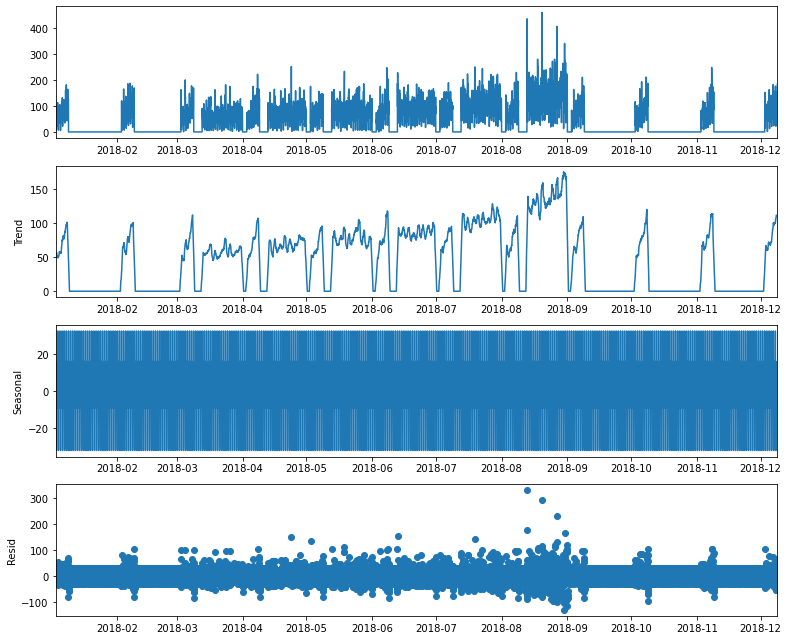

In [27]:
rcParams['figure.figsize'] = 11, 9
#data_hours = data_hourly['num_orders']
decomposed_ordrs = sm.tsa.seasonal_decompose(data_hourly)
figure = decomposed_ordrs.plot()
plt.show()

# ACF AND PACF Plots

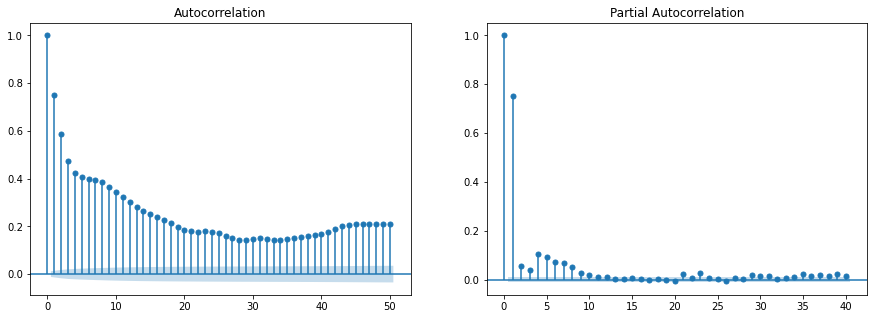

In [28]:
fig, ax = plt.subplots(1,2,figsize=(15,5))
plot_acf(data.squeeze(), lags=50, ax=ax[0])
plot_pacf(data.values.squeeze(), lags=40, ax=ax[1])
plt.show()

From the Autocorrelation plot we can find the MA term i.e q value and from Partial Autocorrelation we can find the AR term i.e p value. Since our data is stationary without differencing, our d value will be 0. 

This sets the lag value to 2 for autoregression AR of q=2 and uses a data difference order of d=0 since our time series is stationary, and uses a moving average model of p=3. 

Lets also cross verify the values of p,d,q in auto_arima model with the lowest AIC. 

[JUST TO VERIFY]

While Dickey-Fuller test implies it’s stationary, there is some autocorrelation as can be seen in ACF plot. Trying to see how its first difference looks like.

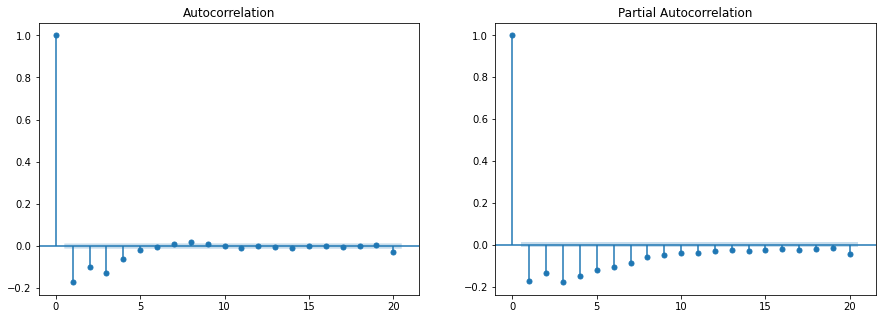

In [29]:
fig, ax = plt.subplots(1,2,figsize=(15,5))
ts_df_diff = (data - data.shift(1)).dropna()
plot_acf(ts_df_diff, lags=20, ax=ax[0])
plot_pacf(ts_df_diff, lags=20, ax=ax[1])
plt.show()

In [30]:
from statsmodels.tsa.stattools import adfuller
from numpy import log
result = adfuller(ts_df_diff.num_orders, autolag='AIC')
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
	print('\t%s: %.3f' % (key, value))

ADF Statistic: -38.987062
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567


This looks more stationary than the original as the ACF plot shows an immediate drop. Lets cross check with Auto Arima to determine the p,q,d values 

# Modelling: 

Model 1: Auto Arima. Splitting the data to train and test. Since predictions should be done in last 10% data. Here the test size is chosen as 0.1

In [31]:
data_hourly

,num_orders
datetime,
2018-01-03 00:00:00,124
2018-01-03 01:00:00,85
2018-01-03 02:00:00,71
2018-01-03 03:00:00,66
2018-01-03 04:00:00,43
...,...
2018-12-08 19:00:00,82
2018-12-08 20:00:00,98
2018-12-08 21:00:00,135


In [32]:
train, test = train_test_split(data_hourly, test_size=0.1)

In [33]:
train.shape

(7344, 1)

In [34]:
test.shape

(816, 1)

In [35]:
auto_arima_fit = pm.auto_arima(train, start_p=1, start_q=1,
                             max_p=3, max_q=3, m=24*7,
                             start_P=0, seasonal=False,
                             d=0, trace=True,
                             error_action='ignore',
                             suppress_warnings=True,
                             stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=70305.255, Time=1.19 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=83696.484, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=70886.169, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=78177.907, Time=0.33 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=69700.717, Time=1.07 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=70421.511, Time=0.16 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=69686.698, Time=1.65 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=70386.347, Time=0.18 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=inf, Time=2.76 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=69692.032, Time=1.20 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=69673.622, Time=4.39 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=69687.157, Time=2.66 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=70230.385, Time=0.56 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=69646.295, Time=5.43 sec
 ARIMA(2,0,2)(0,0,0)[0] i

In [36]:
auto_arima_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 7344
Model:               SARIMAX(3, 0, 3)   Log Likelihood              -34770.207
Date:                Mon, 21 Mar 2022   AIC                          69556.415
Time:                        16:17:52   BIC                          69611.628
Sample:                             0   HQIC                         69575.394
                               - 7344                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.2071      0.087      2.368      0.018       0.036       0.378
ar.L1          1.9882      0.052     37.947      0.000       1.885       2.091
ar.L2         -1.4654      0.086    -17.061      0.000      -1.634      -1.297
ar.L3          0.4730      0.036     13.188      0.000       0.403       0.543
ma.L1         -1.4380      0.052    -27.564      0.000      -1.540      -1.336
ma.L2          0.8156      0.057     14.277      0.000       0.704       0.928
ma.L3         -0.2751      0.015    -18.297      0.000      -0.305      -0.246
sigma2       754.7942      6.298    119.853      0.000     742.451     767.137
===================================================================================
Ljung-Box (L1) (Q):                   0.05   Jarque-Bera (JB):             18473.49
Prob(Q):                              0.83   Prob(JB):                         0.00
Heteroskedasticity (H):               2.16   Skew:                             0.80
Prob(H) (two-sided):                  0.00   Kurtosis:                        10.61
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

AUTO ARIMA with different end p and q values, different set of hyperparameters, also with d = 1, to check what happens when differenced.

In [37]:
auto_arima_fit_2 = pm.auto_arima(train, start_p=1, start_q=1,
                             max_p=5, max_q=5, trace=True,
                             error_action='ignore',
                             suppress_warnings=True, stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=69700.948, Time=1.14 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=71217.344, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=70608.490, Time=0.22 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=70412.251, Time=0.70 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=71215.344, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=69686.388, Time=1.99 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=70542.676, Time=0.31 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=69601.396, Time=2.20 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=70366.620, Time=0.34 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=69582.682, Time=2.87 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=70170.262, Time=0.50 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=69580.165, Time=2.95 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=69982.432, Time=0.63 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=69582.151, Time=6.64 sec
 ARIMA(4,1,2)(0,0,0

In [38]:
auto_arima_fit_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 7344
Model:               SARIMAX(5, 1, 1)   Log Likelihood              -34782.083
Date:                Mon, 21 Mar 2022   AIC                          69578.165
Time:                        16:24:12   BIC                          69626.476
Sample:                             0   HQIC                         69594.772
                               - 7344                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4163      0.013     32.214      0.000       0.391       0.442
ar.L2          0.0767      0.009      8.164      0.000       0.058       0.095
ar.L3         -0.1017      0.009    -11.398      0.000      -0.119      -0.084
ar.L4         -0.0539      0.010     -5.400      0.000      -0.074      -0.034
ar.L5         -0.0284      0.010     -2.765      0.006      -0.049      -0.008
ma.L1         -0.8588      0.012    -72.690      0.000      -0.882      -0.836
sigma2       761.6857      5.975    127.473      0.000     749.974     773.397
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):             17894.10
Prob(Q):                              0.98   Prob(JB):                         0.00
Heteroskedasticity (H):               2.15   Skew:                             0.62
Prob(H) (two-sided):                  0.00   Kurtosis:                        10.55
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [39]:
TEST_SIZE = 816
train, test = data_hourly.iloc[:-TEST_SIZE], data.iloc[-TEST_SIZE:]
x_train, x_test = np.array(range(train.shape[0])), np.array(range(train.shape[0], data_hourly.shape[0]))
train.shape, x_train.shape, test.shape, x_test.shape

((7344, 1), (7344,), (816, 1), (816,))

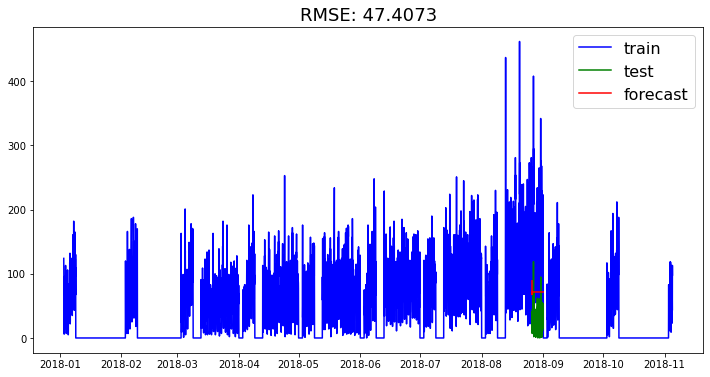

In [40]:
def plot_forecast(series_train, series_test, forecast, forecast_int):

    #mae = mean_absolute_error(series_test, forecast)
    #mape = mean_absolute_percentage_error(series_test, forecast)
    rmse = sqrt(mean_squared_error(series_test, forecast))

    plt.figure(figsize=(12, 6))
    plt.title(f"RMSE: {rmse:.4f}", size=18)
    plt.plot(series_train,label="train", color="b")
    plt.plot(series_test,label="test", color="g")
    #print(forecast)
    forecast= pd.DataFrame(forecast)
    forecast.index = series_test.index
    plt.plot(forecast,label="forecast", color="r")
    plt.legend(prop={"size": 16})
    plt.show()

    return rmse

forecast,forecast_int = auto_arima_fit_2.predict(n_periods=TEST_SIZE, return_conf_int=True)
auto_arima_rmse_2 = plot_forecast(train, test, forecast,forecast_int)

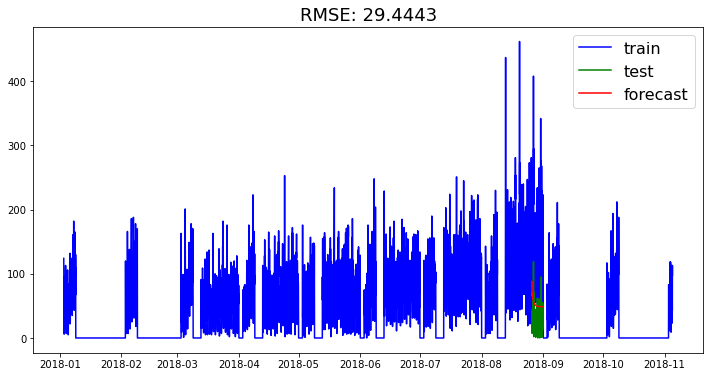

In [41]:
# without differencing

forecast,forecast_int = auto_arima_fit.predict(n_periods=TEST_SIZE, return_conf_int=True)
auto_arima_rmse = plot_forecast(train, test, forecast,forecast_int)

# Model 2: ARIMA

# Rolling Forecast ARIMA Model

In [37]:
data_hourly

,num_orders
datetime,
2018-01-03 00:00:00,124
2018-01-03 01:00:00,85
2018-01-03 02:00:00,71
2018-01-03 03:00:00,66
2018-01-03 04:00:00,43
...,...
2018-12-08 19:00:00,82
2018-12-08 20:00:00,98
2018-12-08 21:00:00,135


In [42]:
display(data_hourly.iloc[7345])

num_orders    76
Name: 2018-11-05 01:00:00, dtype: int64

output [88.05261031]
yhat 88.05261030694415
preds [88.05261030694415]
Forecasted after model fit: 47.98189411702784
list: [47.98189411702784]
predicted=88.052610, expected=107.000000
output [89.00631523]
yhat 89.00631522822087
preds [88.05261030694415, 89.00631522822087]
Forecasted after model fit: 47.9964360281232
list: [47.98189411702784, 47.9964360281232]
predicted=89.006315, expected=76.000000
output [71.4067729]
yhat 71.40677289592216
preds [88.05261030694415, 89.00631522822087, 71.40677289592216]
Forecasted after model fit: 48.01276784955971
list: [47.98189411702784, 47.9964360281232, 48.01276784955971]
predicted=71.406773, expected=93.000000
output [77.42905814]
yhat 77.42905813973647
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647]
Forecasted after model fit: 48.008657934463265
list: [47.98189411702784, 47.9964360281232, 48.01276784955971, 48.008657934463265]
predicted=77.429058, expected=69.000000
output [70.59474893]
yhat 70.59474893180163
pr

output [82.49654213]
yhat 82.4965421278618
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618]
Forecasted after model fit: 48.01938123009797
list: [47.98189411702784, 47.9964360281232, 48.01276784955971, 48.008657934463265, 48.00873082274202, 47.99422703287056, 47.9870945531584, 47.9950915024777, 47.980364826559736, 47.98181250362172, 47.98668855601882, 47.99554288736083, 48.00311661287655, 47.99634585808517, 47.999728825647246, 47.99769720597759, 48.010779315455274, 48.01938123009797]
predicted=82.496542, expected=88.000000
output [79.14018202]
yhat 79.1401820154385
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.2228031

output [108.26371984]
yhat 108.2637198366294
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294]
Forecasted after model fit: 48.11832316963183
list: [47.98189411702784, 47.9964360281232, 48.01276784955971, 48.008657934463265, 48.00873082274202, 47.99422703287056, 47.9870945531584, 47.9950915024777, 47.980364826559736, 47.98181250362172, 47.98668855601882, 47.99554288736083, 48.00311661287655, 47.99634585808517, 47.999728825647246, 47.99769720597759, 48.010779315455274, 48.01938123009797, 48.02980208053546, 48.0261063622105, 48.03

output [67.28867479]
yhat 67.28867479157725
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725]
Forecasted after model fit: 48.12097287419102
list: [47.98189411702784, 47.9964360281232, 48.01276784955971, 48.008657934463265, 48.00873082274202, 47.99422703287056, 47.9870945531584, 47.9950915024777, 47.980364826559736, 47.98181250362172, 47.98668855601882, 47.99554288736083, 48.00311661287655, 47.9963

output [63.44171476]
yhat 63.44171476084802
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802]
Forecasted after model fit: 48.127706358233624
list: [47.98189411702784, 47.9964360281232, 48.01276784955971, 48.008657934463265, 48.00873082274202, 47.99422703287056, 47.9870945531584, 47.99

output [60.91057167]
yhat 60.91057167187998
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998]
Forecasted after model fit: 48.13929519855612
list: [47.98189411702784, 47.9964360281232, 48.01

output [124.41505366]
yhat 124.41505366305984
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [123.11856377]
yhat 123.11856377147801
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [78.71432582]
yhat 78.714325817651
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 9

output [68.8222996]
yhat 68.82229960251895
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [80.20371602]
yhat 80.20371602148266
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [86.27414207]
yhat 86.27414206923089
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [95.66450259]
yhat 95.66450258898568
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [148.58762058]
yhat 148.58762057782357
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [82.60625455]
yhat 82.60625454956784
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [110.60216096]
yhat 110.60216095732714
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [93.21035185]
yhat 93.210351849271
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 9

output [83.19624869]
yhat 83.19624868810386
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [117.45211242]
yhat 117.45211242294525
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [93.53468626]
yhat 93.53468625696195
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [127.8137902]
yhat 127.81379019702487
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984

output [31.84147749]
yhat 31.841477485140068
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984

output [30.25291333]
yhat 30.252913334065575
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984

output [20.46153654]
yhat 20.46153653784674
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [16.32477033]
yhat 16.324770330844757
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984

output [12.58040804]
yhat 12.580408039728589
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984

output [9.68243399]
yhat 9.682433986750162
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [7.71117847]
yhat 7.71117846584125
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 9

output [6.19014498]
yhat 6.1901449758055875
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [5.07467896]
yhat 5.074678962179902
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [4.26708052]
yhat 4.26708052276787
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 9

output [3.65309953]
yhat 3.653099532952453
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [3.20526168]
yhat 3.2052616829469542
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [2.86956165]
yhat 2.869561646948455
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [2.63139848]
yhat 2.63139847624619
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 9

output [2.4908694]
yhat 2.490869395108504
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 9

output [2.31602755]
yhat 2.3160275462502753
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [2.30602696]
yhat 2.3060269633800274
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [2.16801158]
yhat 2.1680115783616714
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [2.14649518]
yhat 2.146495183895553
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [2.0521162]
yhat 2.0521162012279177
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [2.02085234]
yhat 2.020852337120033
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.95309286]
yhat 1.9530928592775254
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [2.09394866]
yhat 2.093948656374117
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.96619235]
yhat 1.9661923523827198
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.97523531]
yhat 1.975235314488586
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.94893558]
yhat 1.9489355818345473
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [2.19066435]
yhat 2.190664347412138
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.94002126]
yhat 1.940021256407654
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.93670911]
yhat 1.9367091092343287
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.93262499]
yhat 1.9326249948184682
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.96374956]
yhat 1.9637495626907437
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.93539539]
yhat 1.9353953859174453
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.95729483]
yhat 1.9572948325279924
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.9227349]
yhat 1.9227348975502139
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.92306235]
yhat 1.9230623506782862
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [2.00068384]
yhat 2.000683836961649
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.91480249]
yhat 1.9148024921141271
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.96722628]
yhat 1.9672262838918044
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.93120484]
yhat 1.93120483784584
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 9

output [1.93307974]
yhat 1.9330797363854373
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.91230727]
yhat 1.9123072695768286
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.91362106]
yhat 1.9136210638273354
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.91359447]
yhat 1.9135944744309867
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.91148027]
yhat 1.9114802683502248
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.88814501]
yhat 1.8881450133727284
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.91544822]
yhat 1.9154482188368505
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.91041966]
yhat 1.9104196581249653
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.89776468]
yhat 1.897764683716936
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.92121571]
yhat 1.9212157076420198
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.89651205]
yhat 1.8965120464459986
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.90345416]
yhat 1.9034541649358658
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.89610464]
yhat 1.8961046358156821
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.79174562]
yhat 1.7917456171710597
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [2.00220914]
yhat 2.002209141211914
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.90033769]
yhat 1.9003376859746695
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.89938202]
yhat 1.899382020717006
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.88084301]
yhat 1.8808430143628954
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.87330552]
yhat 1.8733055217080192
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.98318606]
yhat 1.9831860607700875
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.86783988]
yhat 1.867839881073479
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.89917458]
yhat 1.899174582255192
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.895844]
yhat 1.895843997739867
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 90

output [1.8936488]
yhat 1.8936488040769106
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.92179234]
yhat 1.921792338019273
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.72834096]
yhat 1.7283409571116195
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.89633807]
yhat 1.8963380660108768
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.91555468]
yhat 1.9155546846696154
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.88346234]
yhat 1.8834623373970558
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.74079183]
yhat 1.7407918322422162
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.8327265]
yhat 1.8327265038393037
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.88249368]
yhat 1.8824936802302545
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.93051892]
yhat 1.9305189160056884
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.86463505]
yhat 1.8646350512275092
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.89843115]
yhat 1.8984311487137688
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.88838058]
yhat 1.8883805796736937
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.89700333]
yhat 1.8970033294894506
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.91320343]
yhat 1.913203426392819
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.88835761]
yhat 1.8883576071471353
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.8745967]
yhat 1.8745966952730058
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.88771747]
yhat 1.8877174726976307
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.89614529]
yhat 1.8961452854960683
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.8857074]
yhat 1.8857073960045199
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.87851085]
yhat 1.8785108452671366
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.88473728]
yhat 1.884737277575482
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.88449244]
yhat 1.8844924419009033
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.88349687]
yhat 1.8834968749728347
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.88334948]
yhat 1.8833494848775416
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.87931982]
yhat 1.879319823241282
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.87937128]
yhat 1.879371279021612
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.88089014]
yhat 1.8808901363944912
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.8807881]
yhat 1.8807881016413148
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.88012759]
yhat 1.8801275862832867
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.87967573]
yhat 1.8796757299562898
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.88053938]
yhat 1.8805393797637038
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.87162137]
yhat 1.87162137293479
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 9

output [1.87905058]
yhat 1.8790505758402318
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.87651089]
yhat 1.8765108936995674
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.89289434]
yhat 1.892894340669983
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.89332134]
yhat 1.8933213396073683
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.8699329]
yhat 1.8699329030071965
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.8760685]
yhat 1.8760685019241592
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.87276778]
yhat 1.8727677830885199
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.97244371]
yhat 1.9724437081299655
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.95633297]
yhat 1.9563329684646789
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.86706555]
yhat 1.8670655493826587
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.86665739]
yhat 1.866657386630628
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.87175231]
yhat 1.8717523138462582
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.87191557]
yhat 1.8719155736770219
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.87463812]
yhat 1.8746381161368433
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.88085014]
yhat 1.8808501434836558
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.87170277]
yhat 1.871702769625756
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.86578555]
yhat 1.865785552288429
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [2.01579079]
yhat 2.0157907860587585
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.88174771]
yhat 1.8817477135350984
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.95541643]
yhat 1.955416429617678
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.98612695]
yhat 1.9861269487779083
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.88054365]
yhat 1.8805436452737965
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.86484577]
yhat 1.8648457690706834
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.86269823]
yhat 1.862698226023241
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.86999157]
yhat 1.869991570579785
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.86760517]
yhat 1.8676051686137072
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.86615224]
yhat 1.866152238138774
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.86346253]
yhat 1.8634625336784367
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.86584803]
yhat 1.865848026719462
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.86262156]
yhat 1.862621558652414
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.88749316]
yhat 1.887493155884755
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.8587043]
yhat 1.8587042982545654
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.85905163]
yhat 1.8590516327216662
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.86108899]
yhat 1.86108899224687
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 9

output [1.7814572]
yhat 1.781457201379979
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 9

output [1.86689622]
yhat 1.8668962155399242
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.85908001]
yhat 1.8590800121963014
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.82578837]
yhat 1.8257883702545783
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.87776626]
yhat 1.8777662614806232
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.85729825]
yhat 1.8572982536083131
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.88449166]
yhat 1.8844916558073166
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.85703864]
yhat 1.8570386408521244
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.85935734]
yhat 1.85935733604191
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 9

output [1.85600855]
yhat 1.856008546244773
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.85811815]
yhat 1.858118148105362
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.85432888]
yhat 1.8543288805343252
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.87105493]
yhat 1.8710549256766171
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.85772008]
yhat 1.857720077083414
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.85323477]
yhat 1.8532347736846333
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.85139486]
yhat 1.8513948591521512
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.8535088]
yhat 1.8535087957651726
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.84936828]
yhat 1.8493682802867824
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.8183329]
yhat 1.8183329040110578
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.85085526]
yhat 1.8508552611517786
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.85018183]
yhat 1.8501818319205867
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.89952171]
yhat 1.899521706383723
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.84845525]
yhat 1.8484552506867544
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.88027049]
yhat 1.880270493737818
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [2.09673512]
yhat 2.0967351202944755
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.84737235]
yhat 1.8473723547620082
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.84625933]
yhat 1.8462593315076887
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.82685445]
yhat 1.826854449777926
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.84403332]
yhat 1.8440333211376299
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.84276907]
yhat 1.8427690675880157
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.84596772]
yhat 1.8459677242747574
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.76771626]
yhat 1.767716260574538
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.83903685]
yhat 1.8390368506258596
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.8426006]
yhat 1.842600600555592
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 9

output [1.84516853]
yhat 1.8451685345233528
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.84065591]
yhat 1.8406559098040773
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.84000054]
yhat 1.840000544536153
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.8971689]
yhat 1.8971688991977729
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.84679061]
yhat 1.846790608460708
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.83446502]
yhat 1.8344650241619007
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.82138759]
yhat 1.8213875940475646
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.84122614]
yhat 1.841226144322384
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.83581659]
yhat 1.8358165859664552
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.83541363]
yhat 1.8354136300312902
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.84430104]
yhat 1.844301037361035
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.84214822]
yhat 1.8421482196696672
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.8340645]
yhat 1.8340644972225775
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.83498298]
yhat 1.834982984346695
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.83610028]
yhat 1.836100278592106
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.89412081]
yhat 1.8941208057702852
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.83737951]
yhat 1.8373795086615985
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.85083422]
yhat 1.85083422287871
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 9

output [1.89640919]
yhat 1.896409194169138
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.82487494]
yhat 1.8248749357402048
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [2.07141849]
yhat 2.0714184871231467
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.89321803]
yhat 1.8932180250162673
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [2.07194303]
yhat 2.0719430276275688
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.83345125]
yhat 1.833451245047172
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.48645099]
yhat 1.4864509948699336
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.82023204]
yhat 1.8202320391928737
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.80271699]
yhat 1.8027169906425726
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.82862793]
yhat 1.8286279326639203
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.81111141]
yhat 1.81111140980655
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 9

output [1.69935966]
yhat 1.699359661259912
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.81596097]
yhat 1.815960969496885
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.87029969]
yhat 1.8702996930919014
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.82742963]
yhat 1.827429626827218
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.94911623]
yhat 1.9491162327799287
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.79298098]
yhat 1.7929809776880603
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.82240676]
yhat 1.8224067624917026
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.81905619]
yhat 1.8190561878277762
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.87586782]
yhat 1.875867818351935
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.82353207]
yhat 1.8235320706654932
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.82084496]
yhat 1.8208449633957002
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.8299316]
yhat 1.8299316030901025
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.82168008]
yhat 1.821680078345814
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.77391895]
yhat 1.7739189504581532
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.89057895]
yhat 1.8905789455337398
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.86799032]
yhat 1.8679903231913286
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.82077126]
yhat 1.820771263577818
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.81763605]
yhat 1.8176360509471579
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.82373214]
yhat 1.8237321436636975
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.84258685]
yhat 1.8425868488044372
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.85458036]
yhat 1.8545803574728623
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.69071014]
yhat 1.6907101436740248
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.80025452]
yhat 1.8002545151202156
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.84535992]
yhat 1.8453599210903562
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.86845286]
yhat 1.8684528575807988
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.82383505]
yhat 1.8238350450165157
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.76323554]
yhat 1.763235541496961
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.80184132]
yhat 1.8018413163332738
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.75583171]
yhat 1.7558317055178847
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.84354503]
yhat 1.8435450300363954
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.81189032]
yhat 1.8118903249379557
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.81646378]
yhat 1.816463777986776
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.76848888]
yhat 1.768488878338843
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.81861046]
yhat 1.8186104647037382
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.86544245]
yhat 1.865442450133017
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.79904758]
yhat 1.7990475797188097
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.81276148]
yhat 1.812761476625397
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.81016427]
yhat 1.8101642677679521
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.81382339]
yhat 1.8138233871151428
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.83188982]
yhat 1.8318898219384465
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.87884811]
yhat 1.8788481092176283
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.86882841]
yhat 1.8688284054422581
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.84367936]
yhat 1.843679361379877
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.85087643]
yhat 1.8508764273940201
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.85052773]
yhat 1.8505277344714983
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.85178621]
yhat 1.8517862106371155
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.85693703]
yhat 1.8569370275278914
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.84126894]
yhat 1.8412689418651809
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.8881932]
yhat 1.8881931995023038
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.8709217]
yhat 1.8709217001636986
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.81805044]
yhat 1.8180504386911593
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.84820999]
yhat 1.848209993552146
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.85173642]
yhat 1.8517364174439734
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.79075153]
yhat 1.790751534212312
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.80119567]
yhat 1.8011956657472794
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.79721473]
yhat 1.7972147291722607
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.79793713]
yhat 1.7979371339231918
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.80031209]
yhat 1.8003120932150694
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.79756064]
yhat 1.7975606438240845
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.82884753]
yhat 1.8288475327003937
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.81007517]
yhat 1.8100751707084797
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.8049808]
yhat 1.8049808045011204
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.74642474]
yhat 1.746424735166535
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.78552222]
yhat 1.7855222179131118
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.79372522]
yhat 1.7937252185768315
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.79218703]
yhat 1.7921870321464581
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.7670591]
yhat 1.7670591020768924
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.79739955]
yhat 1.7973995515162713
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.84841035]
yhat 1.848410345482968
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.79529463]
yhat 1.7952946347583918
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.86698814]
yhat 1.8669881431838888
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.79343731]
yhat 1.7934373054609694
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.73211735]
yhat 1.7321173520818292
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.75749309]
yhat 1.757493092747211
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.76156264]
yhat 1.7615626369444044
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.71215946]
yhat 1.712159463048792
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.73069604]
yhat 1.7306960408064498
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.74630575]
yhat 1.746305754500895
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.7836772]
yhat 1.7836772041286864
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.80847075]
yhat 1.8084707485221116
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.8033345]
yhat 1.803334499354861
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 9

output [1.78959587]
yhat 1.7895958664896838
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.78756507]
yhat 1.787565065721246
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.7700931]
yhat 1.7700931036821643
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.85736017]
yhat 1.8573601703448617
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.81758456]
yhat 1.8175845609493138
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.7955409]
yhat 1.7955409033801715
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.75811463]
yhat 1.758114627720225
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.79054295]
yhat 1.7905429545706468
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.79785082]
yhat 1.7978508208666426
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.77235562]
yhat 1.772355621565815
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.63442516]
yhat 1.6344251559492449
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.87658307]
yhat 1.8765830689151883
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.78382449]
yhat 1.7838244850200198
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.83709016]
yhat 1.8370901550245478
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.69829051]
yhat 1.698290514102517
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [2.00068632]
yhat 2.0006863214498125
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.76282387]
yhat 1.762823868015765
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.82060037]
yhat 1.8206003738979675
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.66183737]
yhat 1.6618373734736878
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.81643848]
yhat 1.8164384762885177
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.77809738]
yhat 1.7780973814636312
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.7729265]
yhat 1.772926500189719
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 9

output [1.77552678]
yhat 1.7755267770691887
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.71163648]
yhat 1.711636483522014
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.77516814]
yhat 1.7751681375434885
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.80619217]
yhat 1.8061921732471546
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.8087214]
yhat 1.8087214019088051
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.77612442]
yhat 1.7761244185983642
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.9081065]
yhat 1.9081064962382612
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.77592731]
yhat 1.7759273110691822
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.77957926]
yhat 1.7795792648202422
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.78865059]
yhat 1.7886505878675152
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.75425229]
yhat 1.7542522933559255
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.7441927]
yhat 1.7441927013187097
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.89945129]
yhat 1.8994512884729815
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.79071461]
yhat 1.7907146105023841
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.66775497]
yhat 1.6677549738270656
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.5134115]
yhat 1.513411498824773
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 9

output [1.73277021]
yhat 1.7327702128849012
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.85369655]
yhat 1.8536965493020432
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.74361923]
yhat 1.743619226083517
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.84596524]
yhat 1.8459652408394334
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.76513239]
yhat 1.7651323934660539
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.77317056]
yhat 1.7731705553083827
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.77109772]
yhat 1.7710977210296122
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.76488406]
yhat 1.7648840582377474
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.76267142]
yhat 1.7626714177999574
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.7651628]
yhat 1.7651628036550733
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.77206919]
yhat 1.7720691928418049
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.75917659]
yhat 1.7591765912317996
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.79380778]
yhat 1.7938077796885423
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.718614]
yhat 1.71861400125146
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 90.

output [1.7225477]
yhat 1.7225476954908885
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.76806568]
yhat 1.7680656771517178
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.76304188]
yhat 1.7630418800509204
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.74483543]
yhat 1.7448354316947388
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.71389924]
yhat 1.7138992417812275
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.77394115]
yhat 1.7739411546998483
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.76054978]
yhat 1.760549776036214
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.70180458]
yhat 1.7018045829877977
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.74712313]
yhat 1.747123133653119
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.75995114]
yhat 1.7599511432111328
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.76377403]
yhat 1.7637740256844836
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.74991123]
yhat 1.749911225827411
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.75791392]
yhat 1.757913923126445
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.76057582]
yhat 1.7605758221215595
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.68988106]
yhat 1.6898810642991364
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.74339438]
yhat 1.7433943805886116
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.75555886]
yhat 1.7555588619883125
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.7561478]
yhat 1.7561478031556135
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.74455149]
yhat 1.7445514890856373
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.75240567]
yhat 1.7524056667710326
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.84194585]
yhat 1.8419458490673009
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.71517329]
yhat 1.715173290834791
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.75067796]
yhat 1.7506779608289875
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.74225154]
yhat 1.7422515440304096
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.77909186]
yhat 1.779091860105467
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.7441878]
yhat 1.7441878023916217
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.86636094]
yhat 1.8663609409117328
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.72009008]
yhat 1.7200900808939608
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.74997938]
yhat 1.7499793840120361
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.99074454]
yhat 1.990744536922584
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.7380198]
yhat 1.7380198007223058
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.7373482]
yhat 1.7373481969209408
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.74732302]
yhat 1.7473230158775692
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.70834757]
yhat 1.708347571883813
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.81959145]
yhat 1.819591451164932
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.75040019]
yhat 1.7504001875187711
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.74649575]
yhat 1.7464957515447566
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.74620523]
yhat 1.7462052261412708
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.7413815]
yhat 1.7413815006172157
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.64259611]
yhat 1.642596113749157
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.7430567]
yhat 1.743056700107232
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 9

output [1.77702873]
yhat 1.7770287320970368
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.79978625]
yhat 1.7997862493539927
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.77140337]
yhat 1.7714033743835742
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.74340758]
yhat 1.7434075792866537
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.8169551]
yhat 1.8169551046071888
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.73967631]
yhat 1.7396763073885921
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.7525568]
yhat 1.7525568027957164
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.74128372]
yhat 1.7412837229933302
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.74033722]
yhat 1.740337224841653
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.74033784]
yhat 1.7403378408500814
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.7461217]
yhat 1.7461217019578825
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.73929544]
yhat 1.7392954402134961
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.7408109]
yhat 1.7408109038834354
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.72339912]
yhat 1.7233991243165576
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.73790716]
yhat 1.7379071586239974
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.73684488]
yhat 1.7368448757163506
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.7385112]
yhat 1.7385111994747717
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.73765065]
yhat 1.7376506528085613
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.72724447]
yhat 1.7272444712646973
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.73426147]
yhat 1.7342614743490117
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.73548678]
yhat 1.7354867790691486
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.73536215]
yhat 1.7353621459501056
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.73603827]
yhat 1.7360382720207284
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.78191272]
yhat 1.7819127160448787
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.73437268]
yhat 1.7343726772426322
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.76257334]
yhat 1.7625733378034383
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.7321493]
yhat 1.7321493022594652
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.72847553]
yhat 1.7284755292487333
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.72996887]
yhat 1.7299688667398954
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.73132112]
yhat 1.731321118255174
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.73038646]
yhat 1.730386460607292
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.73013673]
yhat 1.7301367285233198
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.77197317]
yhat 1.7719731749330379
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.73249519]
yhat 1.732495193011836
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.7447561]
yhat 1.7447560962378361
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.72857652]
yhat 1.7285765163020628
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.72798232]
yhat 1.727982315872012
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.72729215]
yhat 1.7272921484100294
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.72607784]
yhat 1.7260778363304254
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.72919284]
yhat 1.7291928377494372
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.71385393]
yhat 1.7138539302095808
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.72801997]
yhat 1.7280199659612876
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.70593635]
yhat 1.705936350159206
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.60622867]
yhat 1.6062286735719624
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.742095]
yhat 1.742094996628147
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 90

output [1.7115305]
yhat 1.7115304999763268
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.70885226]
yhat 1.7088522581522625
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.76470269]
yhat 1.7647026865153848
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.70825256]
yhat 1.708252563193959
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.72210143]
yhat 1.7221014257526832
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.72142921]
yhat 1.721429213597446
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.78370601]
yhat 1.7837060116617636
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.72980376]
yhat 1.729803764797964
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.73613356]
yhat 1.7361335587862925
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.75293164]
yhat 1.7529316406331503
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.71435807]
yhat 1.7143580732797261
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.70081625]
yhat 1.7008162540140717
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.7133905]
yhat 1.7133904985388924
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.71954765]
yhat 1.7195476499053868
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.70537286]
yhat 1.7053728580192384
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.84177133]
yhat 1.8417713271729994
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.75659761]
yhat 1.7565976078596677
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.71555138]
yhat 1.7155513812773435
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.40405269]
yhat 1.4040526893870648
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.71585185]
yhat 1.7158518507740013
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.71499243]
yhat 1.7149924281123106
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.78606965]
yhat 1.786069651438197
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.84881506]
yhat 1.8488150590092616
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.74145469]
yhat 1.7414546883503306
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.71250042]
yhat 1.71250041545305
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 9

output [1.74432748]
yhat 1.744327476844802
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.72677021]
yhat 1.7267702088363137
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.71508693]
yhat 1.7150869250478777
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.71565103]
yhat 1.7156510269200638
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.71128367]
yhat 1.7112836696409133
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.71461511]
yhat 1.7146151085855053
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.68086589]
yhat 1.6808658922890842
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.70994856]
yhat 1.7099485592990789
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.73807164]
yhat 1.7380716380224968
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.71089485]
yhat 1.7108948522508172
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.71652032]
yhat 1.7165203203049728
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.71100383]
yhat 1.7110038281150537
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.6921772]
yhat 1.6921772013492955
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.71726981]
yhat 1.7172698118768466
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.70780566]
yhat 1.7078056611610677
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.70489524]
yhat 1.704895244964014
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.72531134]
yhat 1.7253113369359525
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.69335609]
yhat 1.693356091822487
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.69969613]
yhat 1.6996961292999657
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.70587575]
yhat 1.705875745673218
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.70768149]
yhat 1.7076814884768936
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.7054587]
yhat 1.7054587022182588
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.7194759]
yhat 1.7194758953688023
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.70216766]
yhat 1.7021676639855556
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.70653739]
yhat 1.7065373865473958
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.70998638]
yhat 1.7099863766680272
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.70390304]
yhat 1.703903036032969
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.70510842]
yhat 1.7051084226702997
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.70237409]
yhat 1.702374094677026
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.72367177]
yhat 1.7236717652547
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 90

output [1.68379551]
yhat 1.6837955093164965
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.70375025]
yhat 1.7037502514074845
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.71096426]
yhat 1.710964260917649
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.69687154]
yhat 1.6968715415079316
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.69801236]
yhat 1.6980123597786942
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.68602222]
yhat 1.6860222150403743
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.69737123]
yhat 1.6973712256420512
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.69594105]
yhat 1.6959410496028084
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.7291547]
yhat 1.7291547003788779
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.69707851]
yhat 1.6970785055170978
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.69377717]
yhat 1.6937771741921068
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.69820135]
yhat 1.6982013494366015
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.69336064]
yhat 1.6933606413778293
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.68455246]
yhat 1.684552462544623
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.70084919]
yhat 1.7008491868629179
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.6931502]
yhat 1.6931502042059563
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.75323304]
yhat 1.7532330443102353
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.69169082]
yhat 1.69169081746346
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 9

output [1.69119065]
yhat 1.6911906450912042
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.59356583]
yhat 1.5935658297678046
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.69071764]
yhat 1.6907176355135647
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.69298538]
yhat 1.6929853817438811
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.61200653]
yhat 1.612006534144463
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.69000943]
yhat 1.6900094319088907
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.68498011]
yhat 1.6849801054077176
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.67872737]
yhat 1.6787273664766431
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.64765553]
yhat 1.6476555333602292
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.75907706]
yhat 1.7590770632012394
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.76154762]
yhat 1.7615476243254946
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.5298909]
yhat 1.5298909005095425
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.71176245]
yhat 1.7117624519112482
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.68669695]
yhat 1.6866969482689171
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.6767164]
yhat 1.6767163973215276
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.69063877]
yhat 1.6906387679997295
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.68347771]
yhat 1.6834777145091877
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.68852568]
yhat 1.688525682046766
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [1.68883514]
yhat 1.6888351428304844
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.68293214]
yhat 1.6829321418428762
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.68471762]
yhat 1.6847176246647493
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.68747088]
yhat 1.6874708791261455
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.669263]
yhat 1.6692630038421115
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 9

output [1.68294057]
yhat 1.6829405730160332
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.68338165]
yhat 1.6833816482594912
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.63374732]
yhat 1.6337473219277996
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.63802677]
yhat 1.6380267691135941
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.69918807]
yhat 1.6991880689714662
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.69684899]
yhat 1.6968489868584626
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.67797905]
yhat 1.6779790464262447
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.68560466]
yhat 1.6856046637981024
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.68192474]
yhat 1.6819247409736633
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.67588817]
yhat 1.67588817289856
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 9

output [1.72181952]
yhat 1.7218195189173215
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [1.67832354]
yhat 1.6783235431872114
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [57.87875652]
yhat 57.878756516042614
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984

output [101.1062484]
yhat 101.1062483970106
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [50.13479932]
yhat 50.13479932012623
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [26.98197617]
yhat 26.981976166515516
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984

output [31.741038]
yhat 31.741038004037758
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [32.87819248]
yhat 32.87819248077844
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [26.60869253]
yhat 26.60869252681458
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [27.14403956]
yhat 27.144039562082128
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984

output [58.63067077]
yhat 58.630670767183794
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984

output [82.60765251]
yhat 82.6076525080264
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [70.67288266]
yhat 70.67288265721675
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [63.6174111]
yhat 63.61741110190526
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [43.46396111]
yhat 43.46396110804656
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [52.98988078]
yhat 52.98988077689775
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [57.78765602]
yhat 57.78765602371986
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [67.11447848]
yhat 67.1144784794567
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [61.67971468]
yhat 61.679714683117645
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984

output [76.62618587]
yhat 76.62618586911354
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [88.56062387]
yhat 88.56062387032955
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [55.64919383]
yhat 55.64919382909818
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [46.24412921]
yhat 46.24412920599756
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [69.58076545]
yhat 69.58076544808222
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [71.20560496]
yhat 71.20560495569737
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [62.14090022]
yhat 62.140900221964124
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984

output [73.79685592]
yhat 73.79685592014414
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [71.39205668]
yhat 71.39205667635167
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [70.93445382]
yhat 70.93445382064434
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [68.98623566]
yhat 68.98623566105876
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [45.84280542]
yhat 45.84280542469959
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [25.67290288]
yhat 25.67290287821639
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [23.7576771]
yhat 23.757677103388076
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [28.20566992]
yhat 28.205669923499983
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984

output [62.44944468]
yhat 62.4494446835768
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [73.85443624]
yhat 73.85443623959054
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [82.30147238]
yhat 82.30147237501156
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [64.69933474]
yhat 64.69933474342633
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [41.18515497]
yhat 41.18515496947262
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [51.13910985]
yhat 51.139109850585726
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984

output [68.45599538]
yhat 68.45599537998221
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [70.3768008]
yhat 70.37680079836804
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [93.22252629]
yhat 93.22252628781342
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [58.05180893]
yhat 58.05180892898275
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [56.6950502]
yhat 56.69505020018311
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [53.02495668]
yhat 53.024956676200404
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984

output [58.25750017]
yhat 58.25750016669441
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [67.50978151]
yhat 67.50978150784466
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [76.69308327]
yhat 76.6930832657348
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [79.35361442]
yhat 79.35361442260835
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [109.46467105]
yhat 109.46467104941127
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [73.46195512]
yhat 73.46195512412528
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [113.7132059]
yhat 113.71320590175769
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984

output [102.27754343]
yhat 102.27754342611605
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [57.39019007]
yhat 57.39019006718502
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [47.7954198]
yhat 47.79541980321588
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [39.84393706]
yhat 39.84393705855371
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [42.97296543]
yhat 42.97296542943887
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [66.12000642]
yhat 66.1200064211513
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [69.24744219]
yhat 69.24744218868699
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [57.46161243]
yhat 57.4616124339682
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [63.48535731]
yhat 63.48535730658807
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [47.76413118]
yhat 47.76413117563217
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [55.17903413]
yhat 55.17903412834488
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [69.66659023]
yhat 69.66659023330467
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [92.35569532]
yhat 92.35569531877222
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [81.51350026]
yhat 81.513500258828
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 9

output [64.13915393]
yhat 64.13915392566064
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [47.17762111]
yhat 47.17762111072783
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [66.02441716]
yhat 66.02441715890794
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [73.91068075]
yhat 73.91068074680018
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [64.47602596]
yhat 64.47602596052589
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [59.87697723]
yhat 59.876977226287764
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984

output [66.79940832]
yhat 66.79940831602933
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [108.89910642]
yhat 108.89910641808875
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [100.43521216]
yhat 100.43521215801053
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [92.29754669]
yhat 92.29754668751337
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [71.78518607]
yhat 71.78518606626164
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [74.78374945]
yhat 74.78374944827189
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [65.89421039]
yhat 65.89421039328653
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [45.73358748]
yhat 45.73358748256014
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [47.04341517]
yhat 47.043415170224534
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984

output [74.69343177]
yhat 74.69343176790328
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [67.12040292]
yhat 67.12040291767379
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [75.37661869]
yhat 75.37661868824114
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [63.35710287]
yhat 63.357102867508935
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984

output [54.42375037]
yhat 54.423750372884584
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984

output [66.16016885]
yhat 66.16016885399051
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [80.29643204]
yhat 80.29643204092372
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [71.04685872]
yhat 71.04685872093572
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [98.8261624]
yhat 98.82616240098852
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [93.73686337]
yhat 93.73686336783067
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [75.66108734]
yhat 75.66108733572054
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [71.80865888]
yhat 71.80865887970529
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [93.96092161]
yhat 93.9609216111592
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [106.51955364]
yhat 106.5195536386797
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984

output [87.75062705]
yhat 87.75062704577667
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [133.98530365]
yhat 133.98530364563817
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [120.12849195]
yhat 120.12849194993811
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [119.48769981]
yhat 119.48769981074881
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [101.39441586]
yhat 101.39441586359958
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [128.84202126]
yhat 128.842021263251
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [113.76385821]
yhat 113.76385820504245
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [73.12620803]
yhat 73.12620802525178
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [51.20168277]
yhat 51.20168277361732
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [58.40328596]
yhat 58.40328595665339
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [93.28279546]
yhat 93.28279546358223
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [110.29800738]
yhat 110.29800738049028
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [109.40504266]
yhat 109.40504266059082
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [83.09277804]
yhat 83.09277803998546
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [101.30337619]
yhat 101.30337618776525
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [86.28514363]
yhat 86.28514362663068
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [73.10976592]
yhat 73.1097659213365
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [80.47158984]
yhat 80.47158984005904
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [110.97630821]
yhat 110.97630820729961
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [118.13952086]
yhat 118.13952086261992
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [75.49686931]
yhat 75.49686931009498
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [75.79350611]
yhat 75.7935061104373
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [84.96023376]
yhat 84.96023375998922
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [92.55521486]
yhat 92.55521486436092
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [102.37807614]
yhat 102.37807613517668
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [113.55407434]
yhat 113.55407434065421
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [139.00368685]
yhat 139.00368684675402
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [145.54256214]
yhat 145.5425621396529
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984

output [132.83773307]
yhat 132.83773306543213
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [119.17006856]
yhat 119.17006855619357
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [106.70812694]
yhat 106.70812693589366
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [75.51589195]
yhat 75.51589194645595
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [55.83132246]
yhat 55.831322459156176
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984

output [57.02887394]
yhat 57.02887394044678
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [100.10726302]
yhat 100.107263015564
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [113.91257042]
yhat 113.91257042313683
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [106.1957294]
yhat 106.19572940273511
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984

output [83.24525186]
yhat 83.2452518607956
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984, 

output [101.36850324]
yhat 101.36850324372513
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [109.46164116]
yhat 109.46164115556275
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [101.28144338]
yhat 101.28144338326415
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [122.79089093]
yhat 122.79089093054561
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [132.33663007]
yhat 132.33663007031322
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [111.33368631]
yhat 111.33368630940498
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [84.50764613]
yhat 84.50764613146578
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [84.63546059]
yhat 84.63546058770643
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [99.95487033]
yhat 99.95487032796949
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.41505366305984,

output [124.99735916]
yhat 124.99735915645348
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

output [118.11822999]
yhat 118.11822999035884
preds [88.05261030694415, 89.00631522822087, 71.40677289592216, 77.42905813973647, 70.59474893180163, 44.81336815633435, 41.22280317201184, 58.34079679226258, 42.04766998745514, 58.36153155707845, 66.18219337403133, 73.8980950471852, 73.90523908362928, 52.65875371314902, 54.40499644744639, 56.79879336955727, 74.22564936167325, 82.4965421278618, 79.1401820154385, 60.04290096304779, 64.6237798607453, 72.01284795581796, 84.21164789838454, 86.53098010497749, 98.13302928750664, 119.08620159242042, 108.2637198366294, 97.20856702883077, 99.71086385867392, 96.63653124747862, 79.49686459211574, 63.79028183732677, 46.80867103787643, 67.28867479157725, 81.71038172406396, 83.11913309478459, 74.37001921977831, 63.925886200541825, 67.06329613547398, 63.44171476084802, 69.28993519759888, 76.30298770761428, 76.62227711110398, 59.517235260410715, 60.91057167187998, 63.258066159344594, 88.88868352242741, 86.39082706723141, 79.3186889203626, 124.4150536630598

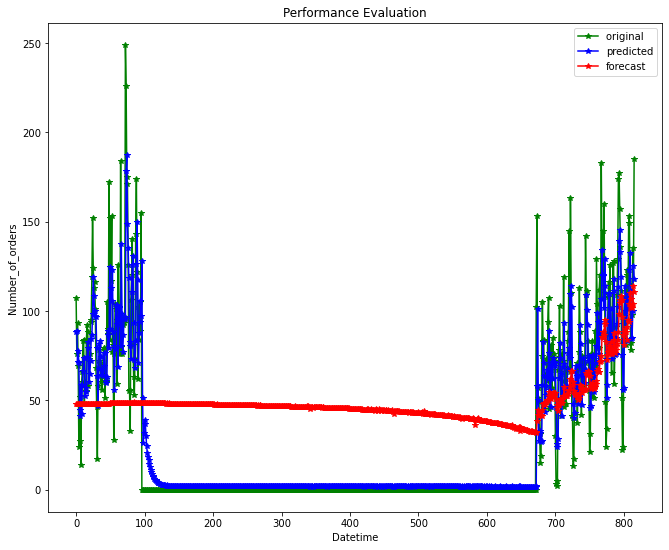

In [57]:
X = data_hourly.values
size = int(len(X) * 0.9)


train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = []
#vector = np.vectorize(np.float)
fut_forecast=[]


for t in range(len(test)):
    model = ARIMA(history, order=(3,0,3))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)
    print('predicted=%f, expected=%f' % (yhat, obs))
    
# plot
plt.plot(test, color='green',label = 'original ', marker = '*')
plt.plot(predictions, color='blue', label = 'predicted', marker = '*')
plt.title('ARIMA Model Predictions')
plt.xlabel('Datetime')
plt.ylabel('Number_of_orders')
plt.legend()
plt.show()

In [49]:
import math
error = mean_squared_error(test, predictions)
print('Test Root Mean Squared Error: %.3f' % math.sqrt(error))

Test Root Mean Squared Error: 19.045


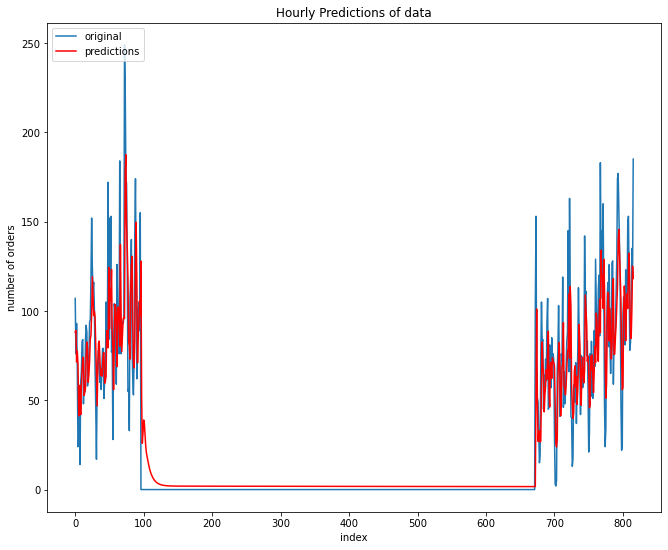

In [33]:
# plot forecasts against actual outcomes
pyplot.plot(test,label='original')
pyplot.plot(predictions_f, color='red',label='predictions' )
pyplot.legend(loc="upper left")
pyplot.xlabel('index')
pyplot.ylabel('number of orders')
pyplot.title('Hourly Predictions of data')
pyplot.show()


# MODEL 3: SARIMA

In [50]:

# Create auto_arima model
model1 = pm.auto_arima(train,
                      seasonal=True, 
                      m=7, 
                      d=1, # non-seasonal difference order
                      D=1, # seasonal difference order
                 	  max_p=6, # max value of p to test 
                      max_q=6, # max value of p to test
                      max_P=6, # max value of P to test 
                      max_Q=6, # max value of Q to test 
                      information_criterion='aic', # used to select best mode
                      trace=True, # prints the information_criterion for each model it fits
                      error_action='ignore', # ignore orders that don't work
                      stepwise=True, # apply an intelligent order search
                      suppress_warnings=True) 

# Print model summary
print(model1.summary())


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[7]             : AIC=inf, Time=11.22 sec
 ARIMA(0,1,0)(0,1,0)[7]             : AIC=75994.885, Time=0.18 sec
 ARIMA(1,1,0)(1,1,0)[7]             : AIC=73576.160, Time=1.04 sec
 ARIMA(0,1,1)(0,1,1)[7]             : AIC=inf, Time=3.43 sec
 ARIMA(1,1,0)(0,1,0)[7]             : AIC=75213.081, Time=0.23 sec
 ARIMA(1,1,0)(2,1,0)[7]             : AIC=73032.731, Time=1.94 sec
 ARIMA(1,1,0)(3,1,0)[7]             : AIC=72668.171, Time=3.35 sec
 ARIMA(1,1,0)(4,1,0)[7]             : AIC=72089.946, Time=5.88 sec
 ARIMA(1,1,0)(5,1,0)[7]             : AIC=71888.717, Time=8.78 sec
 ARIMA(1,1,0)(6,1,0)[7]             : AIC=71451.540, Time=14.64 sec
 ARIMA(1,1,0)(6,1,1)[7]             : AIC=inf, Time=95.13 sec
 ARIMA(1,1,0)(5,1,1)[7]             : AIC=inf, Time=25.09 sec
 ARIMA(0,1,0)(6,1,0)[7]             : AIC=72332.569, Time=4.45 sec
 ARIMA(2,1,0)(6,1,0)[7]             : AIC=71347.171, Time=14.14 sec
 ARIMA(2,1,0)(5,1,0)[7]             : 

In [54]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

model = SARIMAX(train,order=(5, 1, 1),seasonal_order=(5,1,0,7),enforce_invertibility=False)
results = model.fit()
results.summary()
fcast = results.predict(start='',len(data_hourly)+38).rename('Forecast')


In [55]:
fcast

2018-12-09 00:00:00    57.568091
2018-12-09 01:00:00    84.280548
2018-12-09 02:00:00    81.110777
2018-12-09 03:00:00    82.131441
2018-12-09 04:00:00    73.320613
2018-12-09 05:00:00    68.059816
2018-12-09 06:00:00    62.616294
2018-12-09 07:00:00    57.578623
2018-12-09 08:00:00    84.291080
2018-12-09 09:00:00    81.121309
2018-12-09 10:00:00    82.141973
2018-12-09 11:00:00    73.331145
2018-12-09 12:00:00    68.070348
2018-12-09 13:00:00    62.626826
2018-12-09 14:00:00    57.589155
2018-12-09 15:00:00    84.301612
2018-12-09 16:00:00    81.131841
2018-12-09 17:00:00    82.152505
2018-12-09 18:00:00    73.341677
2018-12-09 19:00:00    68.080880
2018-12-09 20:00:00    62.637358
2018-12-09 21:00:00    57.599687
2018-12-09 22:00:00    84.312144
2018-12-09 23:00:00    81.142373
2018-12-10 00:00:00    82.163037
2018-12-10 01:00:00    73.352209
2018-12-10 02:00:00    68.091412
2018-12-10 03:00:00    62.647890
2018-12-10 04:00:00    57.610219
2018-12-10 05:00:00    84.322676
2018-12-10

In [66]:
type(fcast)

pandas.core.series.Series

In [59]:
data_hourly

,num_orders
datetime,
2018-01-03 00:00:00,124
2018-01-03 01:00:00,85
2018-01-03 02:00:00,71
2018-01-03 03:00:00,66
2018-01-03 04:00:00,43
...,...
2018-12-08 19:00:00,82
2018-12-08 20:00:00,98
2018-12-08 21:00:00,135


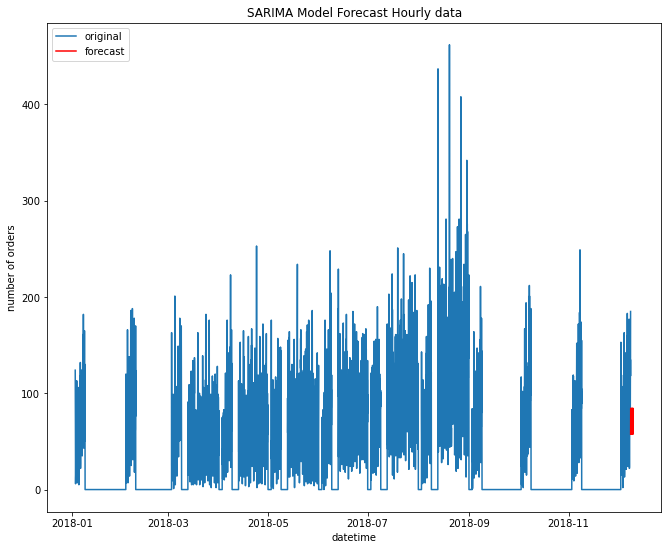

In [97]:
# plot forecasts against actual outcomes
pyplot.plot(data_hourly,label='original')
pyplot.plot(fcast, color='red',label='forecast' )
pyplot.legend(loc="upper left")
pyplot.xlabel('datetime')
pyplot.ylabel('number of orders')
pyplot.title('SARIMA Model Forecast Hourly data')
pyplot.show()

In [92]:
#test[:-38]
y_truth=test.iloc[777:]
y_truth

,num_orders
datetime,
2018-08-31 17:30:00,33
2018-08-31 17:40:00,35
2018-08-31 17:50:00,44
2018-08-31 18:00:00,32
2018-08-31 18:10:00,42
2018-08-31 18:20:00,28
2018-08-31 18:30:00,32
2018-08-31 18:40:00,37
2018-08-31 18:50:00,36


In [96]:
# Create SARIMA mean forecast
sarima_02_pred = results.get_prediction(start='2018-12-09 00:00:00',end='2018-12-10 14:00:00', dynamic=True)
sarima_02_mean = sarima_02_pred.predicted_mean
#print(sarima_02_mean)
#y_forecasted = pred.predicted_mean
y_truth = test['2018-08-31 17:30:00':]
#print(y_truth)
#print(sarima_02_mean)
mse = mean_squared_error(y_truth, sarima_02_mean)
rmse = sqrt(mse)
print("SARIMA MODEL RMSE:", rmse)


SARIMA MODEL RMSE: 43.60464476625249
